In [1]:
import os
import gc
import math
import warnings
from datetime import datetime
from pathlib import Path
from stardist.models import StarDist2D
from csbdeep.utils import normalize
import bin2cell as b2c
import imagecodecs
import ipywidgets as widgets
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL.Image
import scanpy as sc
import tifffile
import zarr
from IPython.display import clear_output, display
import scipy.sparse
import json
import time

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"
os.environ["TF_CPP_MAX_VLOG_LEVEL"] = "0"
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

warnings.filterwarnings("ignore")

import tensorflow as tf
tf.config.threading.set_inter_op_parallelism_threads(2)
tf.config.threading.set_intra_op_parallelism_threads(32)
tf.config.set_visible_devices([], 'GPU')  # TFだけGPU禁止

gpus = tf.config.list_physical_devices("GPU")
for g in gpus:
    tf.config.experimental.set_memory_growth(g, True)
# print("GPUs:", gpus)

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"
%matplotlib inline
# Scanpy settings
sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(
    dpi=100, color_map="viridis", vector_friendly=True, format="png"
)

STEP = 4096

# memory clear
def clear_mem():
    gc.collect()

2026-02-17 15:26:52.280704: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-17 15:26:52.321943: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX512_FP16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-02-17 15:26:53.399638: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-17 15:26:54.

In [51]:
# For HueTracer upgrade
# !pip install git+https://github.com/MANO-B/HueTracer.git
# !pip install -e /app
# !pip install huetracer

/usr/bin/bash: line 1: pip: command not found


In [8]:
# --- Configuration with Default Examples ---
# Set data paths
clear_mem()
default_values = {
    "sample_name": "P2_CRC",
    #"base_dir": "/app/data/10x_colon",
    "base_dir": "/mnt/QNAP1/data/10x_colon", 
    "source_img": "P2_CRC/Visium_HD_Human_Colon_Cancer_P2_tissue_image.btf",
    "exp_path_2um": "P2_CRC/binned_outputs/square_002um",
    "exp_path_8um": "P2_CRC/binned_outputs/square_008um",
    "date": datetime.now().strftime("%y%m%d"),
    #"results_dir": "/app/results/P2_CRC",
    "results_dir": "/home/ikegami/github/HueTracer/results/P2_CRC", 
}

# --- Create UI Elements ---
style = {"description_width": "initial"}
layout = widgets.Layout(width="95%")

sample_name_w = widgets.Text(
    value=default_values["sample_name"],
    description="Sample Name:",
    style=style,
    layout=layout,
)
base_dir_w = widgets.Text(
    value=default_values["base_dir"],
    description="Base Directory:",
    placeholder="Path to your project root",
    style=style,
    layout=layout,
)
source_img_w = widgets.Text(
    value=default_values["source_img"],
    description="Microscope Image (.btf/.tiff):",
    style=style,
    layout=layout,
)
exp_2um_w = widgets.Text(
    value=default_values["exp_path_2um"],
    description="Expression Path (2um):",
    style=style,
    layout=layout,
)
exp_8um_w = widgets.Text(
    value=default_values["exp_path_8um"],
    description="Expression Path (8um):",
    style=style,
    layout=layout,
)
results_dir_w = widgets.Text(
    value=default_values["results_dir"],
    description="Results Directory:",
    style=style,
    layout=layout,
)
date_w = widgets.Text(
    value=default_values["date"],
    description="Date in results directory:",
    style=style,
    layout=layout,
)

output = widgets.Output()


def on_button_clicked(b):
    with output:
        clear_output()
        # Global variables for subsequent cells
        global SAMPLE_NAME, BASE_DIR, SOURCE_IMAGE_PATH, EXPRESSION_PATH, EXPRESSION_PATH_8UM, RESULTS_PATH, source_image_path, TMP_PATH, DATE, B2C_CONFIG_SAVE_PATH

        SAMPLE_NAME = sample_name_w.value
        BASE_DIR = base_dir_w.value
        SOURCE_IMAGE_PATH = os.path.join(base_dir_w.value, source_img_w.value)
        EXPRESSION_PATH = os.path.join(base_dir_w.value, exp_2um_w.value)
        EXPRESSION_PATH_8UM = os.path.join(base_dir_w.value, exp_8um_w.value)
        DATE = date_w.value
        RESULTS_PATH = os.path.join(
            results_dir_w.value, date_w.value
        )
        CONDIG_DIR = os.path.join(
            BASE_DIR, "config"
        )
        TMP_PATH = "/tmp"
        source_image_path = os.path.join(
            EXPRESSION_PATH, "Visium_HD_tissue_image_full_res.tiff"
        )

        # Ensure directory exists
        os.makedirs(RESULTS_PATH, exist_ok=True)
        os.makedirs(TMP_PATH, exist_ok=True)
        os.makedirs(CONDIG_DIR, exist_ok=True)

        B2C_CONFIG_SAVE_PATH = os.path.join(CONDIG_DIR, SAMPLE_NAME + "_" + DATE + "_b2c_config.json")

        config = {
            "SAMPLE_NAME": SAMPLE_NAME,
            "BASE_DIR": BASE_DIR,
            "source_image_path": source_image_path,
            "SOURCE_IMAGE_PATH": SOURCE_IMAGE_PATH,
            "EXPRESSION_PATH": EXPRESSION_PATH,
            "EXPRESSION_PATH_8UM": EXPRESSION_PATH_8UM,
            "RESULTS_PATH": RESULTS_PATH,
            "DATE": DATE,
            "TMP_PATH": TMP_PATH,
            "B2C_CONFIG_SAVE_PATH": B2C_CONFIG_SAVE_PATH
        }

        with open(B2C_CONFIG_SAVE_PATH, "w") as f:
            json.dump(config, f, indent=4)

        print("✅ Configuration saved!")
        print(f"Saved to: {B2C_CONFIG_SAVE_PATH}")
        print(f"✅ Parameters updated and directory created!")
        print(f"Results Path: {RESULTS_PATH}")
        print(f"Expression Path: {EXPRESSION_PATH}")
        print(
            f"Checking 2um path: {'Exists' if os.path.exists(EXPRESSION_PATH) else '⚠️ Not Found'}"
        )
        print("Done! Go ahead.")


run_button = widgets.Button(
    description="Set Paths", button_style="success", icon="check"
)
run_button.on_click(on_button_clicked)

# --- Display GUI ---
print("📦 HueTracer: Visium HD Analysis Setup")
display(
    widgets.VBox(
        [
            sample_name_w,
            base_dir_w,
            widgets.HTML(value="<b>Files from SpaceRanger outputs:</b>"),
            source_img_w,
            exp_2um_w,
            exp_8um_w,
            results_dir_w,
            date_w,
            run_button,
        ]
    ),
    output,
)

📦 HueTracer: Visium HD Analysis Setup


Output()

In [3]:
# --- 1. Load Reference Images (Low-res & CytAssist) ---
# A. Low-res Image
lowres_path = os.path.join(EXPRESSION_PATH_8UM, "spatial", "tissue_lowres_image.png")
if os.path.exists(lowres_path):
    lowres_img = PIL.Image.open(lowres_path)
    lowres_w, lowres_h = lowres_img.size
else:
    lowres_img = PIL.Image.new("RGB", (500, 500), color="gray")
    lowres_w, lowres_h = 500, 500

# B. CytAssist Image
cytassist_path = os.path.join(EXPRESSION_PATH_8UM, "spatial", "cytassist_image.tiff")
cytassist_img = None
if os.path.exists(cytassist_path):
    try:
        ca_data = tifffile.imread(cytassist_path)
        cytassist_img = PIL.Image.fromarray(ca_data)
        cyto_w, cyto_h = cytassist_img.size
    except Exception as e:
        print(f"Error loading CytAssist image: {e}")
        cyto_w, cyto_h = 1000, 1000
else:
    cyto_w, cyto_h = 1000, 1000

# --- 2. Get High-res Dimensions (via Zarr) ---
try:
    store = tifffile.imread(SOURCE_IMAGE_PATH, aszarr=True)
    z_img = zarr.open(store, mode="r")
    full_h, full_w = z_img.shape[0], z_img.shape[1]
except Exception as e:
    full_h, full_w = 10000, 10000
    print(f"Error initializing Zarr: {e}")

# Calculate Scale Factors
scale_x_low = lowres_w / full_w
scale_y_low = lowres_h / full_h

# --- 3. Create Widgets (Step = 1) ---
style = {"description_width": "initial"}
layout_slider = widgets.Layout(width="400px")
layout_text = widgets.Layout(width="100px")

# X Coordinate (step=1)
x_slider = widgets.IntSlider(
    value=0, min=0, max=full_w, step=1, description="", layout=layout_slider
)
x_text = widgets.IntText(
    value=0, description="Start X:", style=style, layout=layout_text
)
widgets.jslink((x_slider, "value"), (x_text, "value"))

# Y Coordinate (step=1)
y_slider = widgets.IntSlider(
    value=0, min=0, max=full_h, step=1, description="", layout=layout_slider
)
y_text = widgets.IntText(
    value=0, description="Start Y:", style=style, layout=layout_text
)
widgets.jslink((y_slider, "value"), (y_text, "value"))

# Width (step=1)
w_slider = widgets.IntSlider(
    value=4000, min=100, max=full_w, step=1, description="", layout=layout_slider
)
w_text = widgets.IntText(
    value=4000, description="Width:", style=style, layout=layout_text
)
widgets.jslink((w_slider, "value"), (w_text, "value"))

# Height (step=1)
h_slider = widgets.IntSlider(
    value=4000, min=100, max=full_h, step=1, description="", layout=layout_slider
)
h_text = widgets.IntText(
    value=4000, description="Height:", style=style, layout=layout_text
)
widgets.jslink((h_slider, "value"), (h_text, "value"))

# Buttons
btn_auto = widgets.Button(description="✨ Auto Detect Tissue", button_style="primary")
btn_preview = widgets.Button(description="Preview Location", button_style="info")
btn_check_hires = widgets.Button(
    description="Check Hi-Res (Detail)", button_style="warning"
)
btn_save = widgets.Button(
    description="Save Cropped TIFF", button_style="success", icon="save"
)
output_area = widgets.Output()

# --- 4. Event Functions ---


def snap_crop_xywh(x, y, w, h, full_w, full_h, step=STEP/8):
    step = int(step)

    # fullが小さすぎる場合の防御
    if full_w < step:
        step_w = full_w
    else:
        step_w = step
    if full_h < step:
        step_h = full_h
    else:
        step_h = step

    # 左上は floor（動かしすぎない）
    x2 = (int(x) // step_w) * step_w
    y2 = (int(y) // step_h) * step_h

    # 幅高さは ceil（小さくしない）
    w2 = int(math.ceil(int(w) / step_w) * step_w) if step_w > 0 else int(w)
    h2 = int(math.ceil(int(h) / step_h) * step_h) if step_h > 0 else int(h)

    # 左上がはみ出さないように（full-step 未満へ）
    x2 = max(0, min(x2, max(0, full_w - step_w)))
    y2 = max(0, min(y2, max(0, full_h - step_h)))

    # 右下がはみ出す場合は幅高さを縮めて step倍数を維持
    max_w = full_w - x2
    max_h = full_h - y2

    if step_w > 0:
        w2 = min(w2, (max_w // step_w) * step_w if max_w >= step_w else max_w)
    else:
        w2 = min(w2, max_w)

    if step_h > 0:
        h2 = min(h2, (max_h // step_h) * step_h if max_h >= step_h else max_h)
    else:
        h2 = min(h2, max_h)

    # 最低1タイル（または残り全幅/全高）
    w2 = max(min(step_w, max_w), w2)
    h2 = max(min(step_h, max_h), h2)

    return int(x2), int(y2), int(w2), int(h2)

def auto_detect_tissue(b):
    with output_area:
        clear_output(wait=True)
        print("🔍 Detecting tissue boundary...")
        parquet_path = os.path.join(
            EXPRESSION_PATH_8UM, "spatial", "tissue_positions.parquet"
        )
        csv_path = os.path.join(EXPRESSION_PATH_8UM, "spatial", "tissue_positions.csv")

        df = None
        if os.path.exists(parquet_path):
            df = pd.read_parquet(parquet_path)
        elif os.path.exists(csv_path):
            df = pd.read_csv(csv_path)

        if df is not None:
            tissue_df = df[df["in_tissue"] == 1]
            if not tissue_df.empty:
                min_x = tissue_df["pxl_col_in_fullres"].min()
                max_x = tissue_df["pxl_col_in_fullres"].max()
                min_y = tissue_df["pxl_row_in_fullres"].min()
                max_y = tissue_df["pxl_row_in_fullres"].max()

                margin = 200

                # いま算出した min/max + margin から x,y,w,h を作ったあとに…
                x0 = max(0, int(min_x - margin))
                y0 = max(0, int(min_y - margin))
                w0 = int(max_x - min_x + (margin * 2))
                h0 = int(max_y - min_y + (margin * 2))

                # STEP倍数にスナップ（full_w/full_h は zarrから取得したやつ）
                x1, y1, w1, h1 = snap_crop_xywh(
                    x0, y0, w0, h0, full_w, full_h, step=STEP/8
                )

                x_text.value = x1
                y_text.value = y1
                w_text.value = w1
                h_text.value = h1

                print(f"✅ Auto-set to tissue boundary.")
                show_preview(None)
            else:
                print("⚠️ No tissue spots found.")
        else:
            print("❌ tissue_positions file not found.")


def show_preview(b):
    with output_area:
        if b is not None:
            clear_output(wait=True)
        plt.close("all")

        x, y, w, h = x_text.value, y_text.value, w_text.value, h_text.value

        # Determine number of plots
        ncols = 2 if cytassist_img else 1
        fig, axes = plt.subplots(1, ncols, figsize=(6 * ncols, 6))
        if ncols == 1:
            axes = [axes]

        # 1. LowRes Plot (With Red Box)
        ax = axes[0]
        box_x = x * scale_x_low
        box_y = y * scale_y_low
        box_w = w * scale_x_low
        box_h = h * scale_y_low

        ax.imshow(lowres_img)
        rect = patches.Rectangle(
            (box_x, box_y), box_w, box_h, linewidth=2, edgecolor="r", facecolor="none"
        )
        ax.add_patch(rect)
        ax.set_title("Low-Res Image (ROI)")

        # 2. CytAssist Plot (Clean, No Box)
        if cytassist_img:
            ax2 = axes[1]
            ax2.imshow(cytassist_img)
            ax2.set_title("CytAssist Image (Ref)")

        plt.show()


def check_hires_detail(b):
    with output_area:
        clear_output(wait=True)
        plt.close("all")
        x, y, w, h = x_text.value, y_text.value, w_text.value, h_text.value
        cx, cy = x + w // 2, y + h // 2
        print(f"Checking center detail at x={cx}, y={cy}")
        try:
            img_sample = z_img[cy : cy + 1000, cx : cx + 1000]
            fig, ax = plt.subplots(figsize=(6, 6))
            ax.imshow(img_sample)
            ax.set_title("Hi-Res Center Detail (1000x1000)")
            plt.show()
        except Exception as e:
            print(f"Error: {e}")
    
# --- Delete Button Definition ---
btn_delete = widgets.Button(
    description='Delete Saved Crop',
    button_style='danger', # Red color
    icon='trash',
    layout=widgets.Layout(width='200px')
)

def delete_crop_image(b):
    with output_area:
        clear_output(wait=True)
        if os.path.exists(source_image_path):
            try:
                os.remove(source_image_path)
                print(f"🗑️  Deleted: {source_image_path}")
                print("You can now save a new crop.")
            except Exception as e:
                print(f"❌ Error during deletion: {e}")
        else:
            print("ℹ️  No file found to delete.")

# Register the callback
btn_delete.on_click(delete_crop_image)

def save_crop_image(b):
    global x1, y1, w1, h1
    with output_area:
        clear_output(wait=True)
        
        # Skip if file already exists
        if os.path.exists(source_image_path):
            print(f"⏭️  File already exists: {source_image_path}")
            print("Using existing file. If you want to overwrite, click 'Delete Saved Crop' first.")
            
            # Sync coordinates even when skipping
            x1, y1, w1, h1 = snap_crop_xywh(
                x_text.value, y_text.value, w_text.value, h_text.value,
                full_w, full_h, step=STEP/8
            )
            return

        print("Saving... Please wait.")
        x1, y1, w1, h1 = snap_crop_xywh(
            x_text.value, y_text.value, w_text.value, h_text.value,
            full_w, full_h, step=STEP/8
        )
        x_text.value, y_text.value, w_text.value, h_text.value = x1, y1, w1, h1

        try:
            # Memory-safe conversion from zarr to ndarray
            crop_data = np.asarray(z_img[y1:y1+h1, x1:x1+w1])
            tifffile.imwrite(source_image_path, crop_data, bigtiff=True, compression="lzw")
            print(f"✅ Saved to: {source_image_path}")
            print(f"Shape: {crop_data.shape} at (x={x1}, y={y1})")
        except Exception as e:
            print(f"❌ Error: {e}")
            
# Link buttons
btn_auto.on_click(auto_detect_tissue)
btn_preview.on_click(show_preview)
btn_check_hires.on_click(check_hires_detail)
btn_save.on_click(save_crop_image)

# Display UI
display(
    widgets.VBox(
        [
            widgets.HTML("<h3>✂️ Visium HD Large Image Cropper</h3>"),
            btn_auto,
            widgets.HTML("<hr>"),
            widgets.HBox([x_text, x_slider]),
            widgets.HBox([y_text, y_slider]),
            widgets.HBox([w_text, w_slider]),
            widgets.HBox([h_text, h_slider]),
            widgets.HBox([btn_preview, btn_check_hires]),
            widgets.HBox([btn_save, btn_delete]),
            output_area,
        ]
    )
)

# Nuclei segmentation with bin2cell

In [4]:
# --- ⚠️ Bin2Cell Safety Check Override (Keep this!) ⚠️ ---
def dummy_check(adata, img):
    print("ℹ️ Skipping image dimension check (Custom Crop Mode)")
    pass


if hasattr(b2c, "bin2cell") and hasattr(b2c.bin2cell, "actual_vs_inferred_image_shape"):
    b2c.bin2cell.actual_vs_inferred_image_shape = dummy_check
elif hasattr(b2c, "actual_vs_inferred_image_shape"):
    b2c.actual_vs_inferred_image_shape = dummy_check
# ---------------------------------------------------------

# --- 1. Parameters Widget ---
HE_full_path = os.path.join(TMP_PATH, "he.tif")
if os.path.exists(HE_full_path):
    os.remove(HE_full_path)

style = {"description_width": "150px"}
layout = widgets.Layout(width="500px")

# Bin2Cell / StarDist Parameters
mpp_w = widgets.FloatSlider(
    value=0.5,
    min=0.1,
    max=2.0,
    step=0.1,
    description="MPP (Microns Per Pixel):",
    style=style,
    layout=layout,
)
prob_he_w = widgets.FloatSlider(
    value=0.05,
    min=0.0,
    max=1.0,
    step=0.05,
    description="Prob Thresh (HE):",
    style=style,
    layout=layout,
)
prob_gex_w = widgets.FloatSlider(
    value=0.7,
    min=0.0,
    max=1.0,
    step=0.05,
    description="Prob Thresh (GEX):",
    style=style,
    layout=layout,
)
nms_w = widgets.FloatSlider(
    value=0.5,
    min=0.0,
    max=1.0,
    step=0.1,
    description="NMS Threshold:",
    style=style,
    layout=layout,
)
max_dist_w = widgets.IntSlider(
    value=2, min=1, max=10, description="Max Bin Distance:", style=style, layout=layout
)

STEP_w = widgets.IntSlider(
    value=STEP, min=256, max=8192, step=256, description="Block size for bin2cell:", style=style, layout=layout
)


btn_load = widgets.Button(
    description="Load Data & Preprocess",
    button_style="primary",
    icon="download",
    layout=widgets.Layout(width="300px"),
)
output_log = widgets.Output()

# Global variables
sp_adata = None
lib_id = None

def update_adata_for_crop(adata, x1, y1, w1, h1, lib_id=None):
    """
    Update AnnData spatial information based on the cropped image area.
    修正版: scalefactorsは変更せず、座標シフトと画像クロップのみを行う。
    
    Args:
        adata: scanpy AnnData object
        x1, y1: Top-left coordinates of the crop in full-res pixels (int)
        w1, h1: Width and height of the crop in full-res pixels (int)
        lib_id: Library ID (if None, taken from adata.uns['spatial'].keys())
    """
    if lib_id is None:
        lib_id = list(adata.uns["spatial"].keys())[0]

    # --- 1. 座標のシフト (Coordinate Shift) ---
    # クロップ開始位置 (x1, y1) を原点 (0,0) に合わせるようシフト
    # 注意: Visium HDのspatial座標はfull-res基準なので、そのまま引き算でOK
    adata.obsm["spatial"] = adata.obsm["spatial"] - np.array([x1, y1])

    # --- 2. 範囲外スポットの除外 (Filtering) ---
    # クロップ範囲に含まれるスポットのみを残す
    subset_mask = (
        (adata.obsm["spatial"][:, 0] >= 0) & 
        (adata.obsm["spatial"][:, 0] < w1) & 
        (adata.obsm["spatial"][:, 1] >= 0) & 
        (adata.obsm["spatial"][:, 1] < h1)
    )
    adata._inplace_subset_obs(subset_mask)
    print(f"✅ Subset spots: {np.sum(subset_mask)} spots remaining.")
    
    # --- 3. 参照画像（lowres/hires）のクロップ ---
    # scalefactors自体は「変更しない」（解像度比率は変わらないため）
    sf = adata.uns["spatial"][lib_id]["scalefactors"]
    
    images_dict = adata.uns["spatial"][lib_id]["images"]
    
    # Lowres画像のクロップ
    if "tissue_lowres_image" in images_dict:
        scale = sf["tissue_lowres_scalef"]
        # 元画像の座標系でのクロップ範囲を計算
        lx = int(x1 * scale)
        ly = int(y1 * scale)
        lw = int(w1 * scale)
        lh = int(h1 * scale)
        
        # スライス実行
        orig_img = images_dict["tissue_lowres_image"]
        # 画像範囲を超えないようにクリップ処理を入れるのが安全
        max_h, max_w = orig_img.shape[:2]
        ly_end = min(ly + lh, max_h)
        lx_end = min(lx + lw, max_w)
        
        images_dict["tissue_lowres_image"] = orig_img[ly:ly_end, lx:lx_end]

    # Hires画像のクロップ（ある場合）
    if "tissue_hires_image" in images_dict:
        scale = sf["tissue_hires_scalef"]
        hx = int(x1 * scale)
        hy = int(y1 * scale)
        hw = int(w1 * scale)
        hh = int(h1 * scale)
        
        orig_img = images_dict["tissue_hires_image"]
        max_h, max_w = orig_img.shape[:2]
        hy_end = min(hy + hh, max_h)
        hx_end = min(hx + hw, max_w)
        
        images_dict["tissue_hires_image"] = orig_img[hy:hy_end, hx:hx_end]

    print(f"✅ AnnData updated for crop at ({x1}, {y1}) with size {w1}x{h1}")
    return adata

def load_data(b):
    global sp_adata, lib_id, mpp, prob_thresh_HE, max_bin_distance, prob_thresh_GEX, nms_thresh, Block_size

    with output_log:
        clear_output()
        print("🚀 Starting Data Loading...")

        # 1. Get Parameters
        mpp = float(mpp_w.value)
        prob_thresh_HE = float(prob_he_w.value)
        max_bin_distance = int(max_dist_w.value)
        prob_thresh_GEX = float(prob_gex_w.value)
        nms_thresh = float(nms_w.value)
        Block_size = int(STEP_w.value)

        try:
            # 2. Load Visium Data (with override)
            print(f"Reading Visium data from: {EXPRESSION_PATH}")
            print(f"Using Cropped Image: {source_image_path}")

            sp_adata = b2c.read_visium(
                EXPRESSION_PATH, source_image_path=source_image_path
            )

            # --- Auto Detect lib_id ---
            lib_id = list(sp_adata.uns["spatial"].keys())[0]
            print(f"✅ Auto-detected lib_id: {lib_id}")
            sp_adata = update_adata_for_crop(sp_adata, x1, y1, w1, h1, lib_id=lib_id)

            # # --- Preprocessing ---
            print("Preprocessing (Filter genes/cells)...")
            sp_adata.var_names_make_unique()
            sc.pp.filter_genes(sp_adata, min_cells=3)
            sc.pp.filter_cells(sp_adata, min_counts=1)

            print(f"Generating Scaled HE Image (mpp={mpp})...")
            b2c.scaled_he_image(sp_adata, mpp=mpp, save_path=HE_full_path)
            print("Running Destriping...")
            b2c.destripe(sp_adata, adjust_counts=True)

            print("✅ Data Loading & Preprocessing Complete!")
            print(f"Final AnnData Shape: {sp_adata.shape}")
            print("Done! Go ahead.")

        except Exception as e:
            print(f"❌ Error: {e}")
            import traceback

            traceback.print_exc()


btn_load.on_click(load_data)

# Display
display(
    widgets.VBox(
        [
            widgets.HTML("<h3>⚙️ Data Loading & Parameters</h3>"),
            widgets.HBox([mpp_w, STEP_w]),
            widgets.HBox([prob_he_w, prob_gex_w]),
            widgets.HBox([nms_w, max_dist_w]),
            widgets.HTML("<br>"),
            btn_load,
            output_log,
        ]
    )
)

In [5]:
def create_roi_selector(adata):
    if adata is None:
        print("❌ Error: sp_adata is not loaded yet. Please run the previous step.")
        return

    # 1. データの現在の範囲を取得 (array_row/col)
    min_row, max_row = int(adata.obs["array_row"].min()), int(
        adata.obs["array_row"].max()
    )
    min_col, max_col = int(adata.obs["array_col"].min()), int(
        adata.obs["array_col"].max()
    )

    print(f"📊 Data Range -- Row(Y): {min_row}-{max_row}, Col(X): {min_col}-{max_col}")

    # 2. スライダーの作成 (IntRangeSliderで範囲選択, step=1)
    style = {"description_width": "initial"}
    layout = widgets.Layout(width="600px")

    # X Range (Array Column)
    x_range_slider = widgets.IntRangeSlider(
        # value=[min_col, max_col],
        value=[min_col, min(min_col+256, max_col)],
        min=min_col,
        max=max_col,
        step=256,
        description="X Range (array_col):",
        style=style,
        layout=layout,
    )

    # Y Range (Array Row)
    y_range_slider = widgets.IntRangeSlider(
        # value=[min_row, max_row],
        value=[min_row, min(min_row+256, max_row)],
        min=min_row,
        max=max_row,
        step=256,
        description="Y Range (array_row):",
        style=style,
        layout=layout,
    )

    # Buttons
    btn_update = widgets.Button(
        description="Update Plot", button_style="info", icon="refresh"
    )
    btn_confirm = widgets.Button(
        description="Confirm & Save ROI", button_style="success", icon="check"
    )
    output_roi = widgets.Output()

    # 3. 画像キーの自動探索 (bin2cellが生成したキーを探す)
    img_keys = [k for k in adata.uns.keys() if "mpp" in k and "buffer" in k]
    target_img_key = img_keys[0] if img_keys else None

    # basisキーの推測
    target_basis = f"spatial_cropped_150_buffer"  # デフォルト

    def plot_roi(b):
        with output_roi:
            clear_output(wait=True)
            plt.close("all")

            # スライダーの値を取得
            x1, x2 = x_range_slider.value
            y1, y2 = y_range_slider.value

            print(f"Filtering: Row {y1}-{y2}, Col {x1}-{x2} ...")

            # マスク作成
            mask = (
                (adata.obs["array_row"] >= y1)
                & (adata.obs["array_row"] <= y2)
                & (adata.obs["array_col"] >= x1)
                & (adata.obs["array_col"] <= x2)
            )

            if np.sum(mask) == 0:
                print("⚠️ No spots in selected range.")
                return

            subset = adata[mask].copy()

            # プロット
            fig, ax = plt.subplots(figsize=(7, 7))
            sc.pl.spatial(
                subset,
                color="n_counts",
                img_key=target_img_key,
                basis=target_basis,
                cmap="Reds",
                show=False,
                ax=ax,
                title=f"ROI: X[{x1}:{x2}], Y[{y1}:{y2}] ({np.sum(mask)} spots)",
            )
            plt.show()
            del subset

    def confirm_roi(b):
        # グローバル変数に書き込む
        global mask_small_x1, mask_small_x2, mask_small_y1, mask_small_y2

        # 注意: 変数名はユーザーの定義に合わせて rows->x, cols->y とマッピング
        # 元のコード: mask_small_x1... は array_row (Y方向) を指していることが多いですが、
        # ユーザーの変数名定義を確認すると:
        # mask_small_x1, x2 -> 1250, 1550 (通常 row/Y)
        # mask_small_y1, y2 -> 50, 350 (通常 col/X)
        # Scanpy/bin2cellの array_row は通常 X1/X2 と対応付けられることが多いです。

        # ここではスライダーの値を以下のように割り当てます
        # Y Range Slider (Row) -> mask_small_x (行番号)
        # X Range Slider (Col) -> mask_small_y (列番号)

        mask_small_x1, mask_small_x2 = y_range_slider.value
        mask_small_y1, mask_small_y2 = x_range_slider.value
        
        with output_roi:
            print("-" * 30)
            print("✅ ROI Variables Saved!")
            print(f"mask_small_x1 = {mask_small_x1}")
            print(f"mask_small_x2 = {mask_small_x2}")
            print(f"mask_small_y1 = {mask_small_y1}")
            print(f"mask_small_y2 = {mask_small_y2}")
            print("-" * 30)
            print("Done! Go ahead.")

    btn_update.on_click(plot_roi)
    btn_confirm.on_click(confirm_roi)

    display(
        widgets.VBox(
            [
                widgets.HTML("<h3>🔍 Select Preview ROI (256x256)</h3>"),
                x_range_slider,
                y_range_slider,
                widgets.HBox([btn_update, btn_confirm]),
                output_roi,
            ]
        )
    )


# 実行
create_roi_selector(sp_adata)

📊 Data Range -- Row(Y): 0-3092, Col(X): 0-3347


Checking ROI: Row 1024-1280, Col 1280-1536


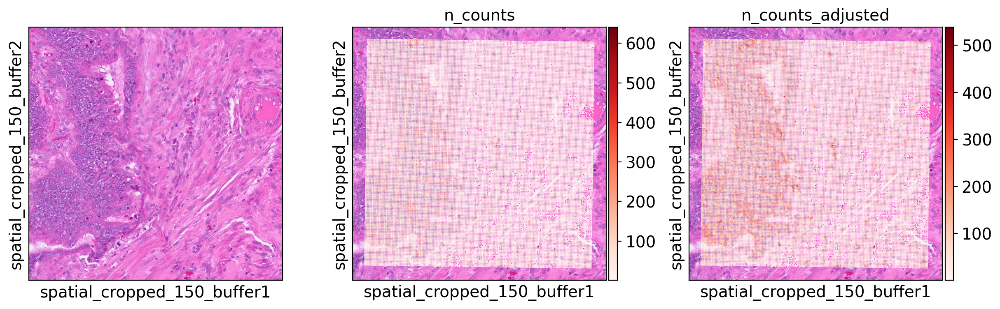

In [6]:
# 指定したROI（array_row/col）が正しく処理されているか確認
print(
    f"Checking ROI: Row {mask_small_x1}-{mask_small_x2}, Col {mask_small_y1}-{mask_small_y2}"
)

mask = (
    (sp_adata.obs["array_row"] >= mask_small_x1)
    & (sp_adata.obs["array_row"] <= mask_small_x2)
    & (sp_adata.obs["array_col"] >= mask_small_y1)
    & (sp_adata.obs["array_col"] <= mask_small_y2)
)

if np.sum(mask) > 0:
    bdata = sp_adata[mask].copy()

    # 処理済み画像キーの生成ルール (mppに依存)
    # mpp=0.5 の場合 -> "0.5_mpp_150_buffer"
    img_key = f"{mpp}_mpp_150_buffer"
    basis_key = f"spatial_cropped_150_buffer"

    sc.pl.spatial(
        bdata,
        color=[None, "n_counts", "n_counts_adjusted"],
        img_key=img_key,
        basis=basis_key,
        show=True,
        cmap="Reds",
    )
    del bdata
    print("Done! Go ahead.")
else:
    print("⚠️ Warning: No spots found in the specified ROI mask.")

🚀 Loading Full High-Res Image...
   Shape: (12513, 13468, 3)
🧪 Normalizing (3% - 99.8%)...
🤖 Running StarDist Model (Direct Execution)...
Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
Stardist predicion start...
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 16/16 [46:08<00:00, 173.06s/it]


✅ Prediction Complete! Detected 306635 nuclei.
💾 Saving labels (scipy sparse) to /tmp/he.npz...
📥 Inserting labels into AnnData...
🎉 Final Integration Result: 2495220 spots have nuclei assigned.
Checking ROI: Row 1024-1280, Col 1280-1536


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.47674423456192017..1.0058140754699707].


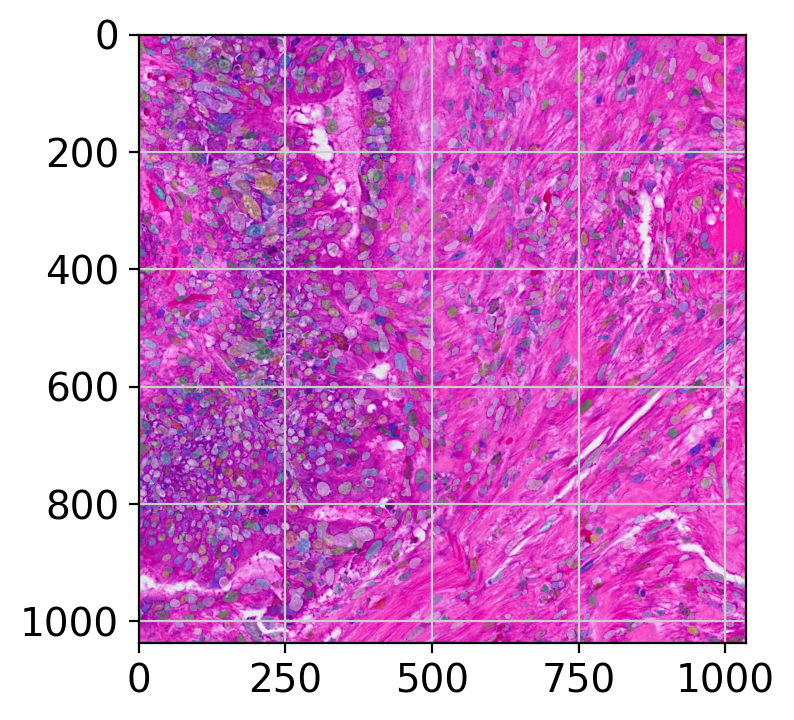

In [7]:
# --- 1. 高画質画像の読み込み ---
print("🚀 Loading Full High-Res Image...")
img = tifffile.imread(HE_full_path)
print(f"   Shape: {img.shape}")

# --- 2. 手動正規化 (診断コードと同じ設定) ---
print("🧪 Normalizing (3% - 99.8%)...")
axis_norm = (0,1)
img_norm = normalize(img, 3, 99.8, axis=axis_norm)

# --- 3. StarDistモデルの直接実行 ---
print("🤖 Running StarDist Model (Direct Execution)...")
model = StarDist2D.from_pretrained('2D_versatile_he')
labels_path = os.path.join(TMP_PATH, "he.npz")
if os.path.exists(labels_path):
    os.remove(labels_path)

# メモリ対策: タイル分割数の計算
target_tile_size = STEP
context=128

print("Stardist predicion start...")
# 診断コードで成功したパラメータを使用
labels, details = model.predict_instances_big(
    img_norm,
    axes="YXC", 
    block_size=target_tile_size, 
    min_overlap=context, 
    context=context,
    prob_thresh=prob_thresh_HE,
    nms_thresh=nms_thresh,
    scale=1.0,
    nms_kwargs={
        'use_kdtree': True,
        'verbose': False
    })

n_detected = len(details['points'])
print(f"✅ Prediction Complete! Detected {n_detected} nuclei.")

# --- 4. 結果を SciPy sparse .npz として保存（bin2cell互換） ---
print(f"💾 Saving labels (scipy sparse) to {labels_path}...")
if os.path.exists(labels_path):
    os.remove(labels_path)
labels_sparse = scipy.sparse.csr_matrix(labels.astype("int32"))
scipy.sparse.save_npz(labels_path, labels_sparse)

# --- 5. bin2cell に取り込み (insert_labels) ---
print("📥 Inserting labels into AnnData...")

target_key = "spatial_cropped_150_buffer" 
img_key = "0.5_mpp_150_buffer"

b2c.insert_labels(
    sp_adata,
    labels_npz_path=labels_path,
    basis="spatial", 
    spatial_key=target_key, 
    mpp=mpp, 
    labels_key="labels_he", 
)

# --- 6. 最終確認 ---
final_count = np.sum(sp_adata.obs['labels_he'] > 0)
print(f"🎉 Final Integration Result: {final_count} spots have nuclei assigned.")

# 指定したROI（array_row/col）が正しく処理されているか確認
print(
    f"Checking ROI: Row {mask_small_x1}-{mask_small_x2}, Col {mask_small_y1}-{mask_small_y2}"
)

mask = (
    (sp_adata.obs["array_row"] >= mask_small_x1)
    & (sp_adata.obs["array_row"] <= mask_small_x2)
    & (sp_adata.obs["array_col"] >= mask_small_y1)
    & (sp_adata.obs["array_col"] <= mask_small_y2)
)

if np.sum(mask) > 0:
    bdata = sp_adata[mask].copy()

    # 処理済み画像キーの生成ルール (mppに依存)
    # mpp=0.5 の場合 -> "0.5_mpp_150_buffer"
    img_key = f"{mpp}_mpp_150_buffer"
    basis_key = f"spatial_cropped_150_buffer"

    bdata = bdata[bdata.obs['labels_he']>0]
    bdata.obs['labels_he'] = bdata.obs['labels_he'].astype(str)
    
    crop = b2c.get_crop(bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)
    rendered = b2c.view_stardist_labels(image_path=HE_full_path, 
                                        labels_npz_path=labels_path, 
                                        crop=crop
                                       )
    plt.imshow(rendered)
    del bdata
else:
    print("⚠️ Labels were generated but not mapped to spots.")
    print("   Potential cause: Coordinate alignment shift.")

🚀 Expanding labels...
   Input Label Key: labels_he
   Max Bin Distance: 2
   Using Image Key: 0.5_mpp_150_buffer
computing PCA
    with n_comps=50
    finished (0:00:55)
✅ Labels expanded successfully. Key: labels_he_expanded
   Plotting 40895 spots in ROI...
the obs value 'labels_he_expanded' has more than 103 categories. Uniform 'grey' color will be used for all categories.


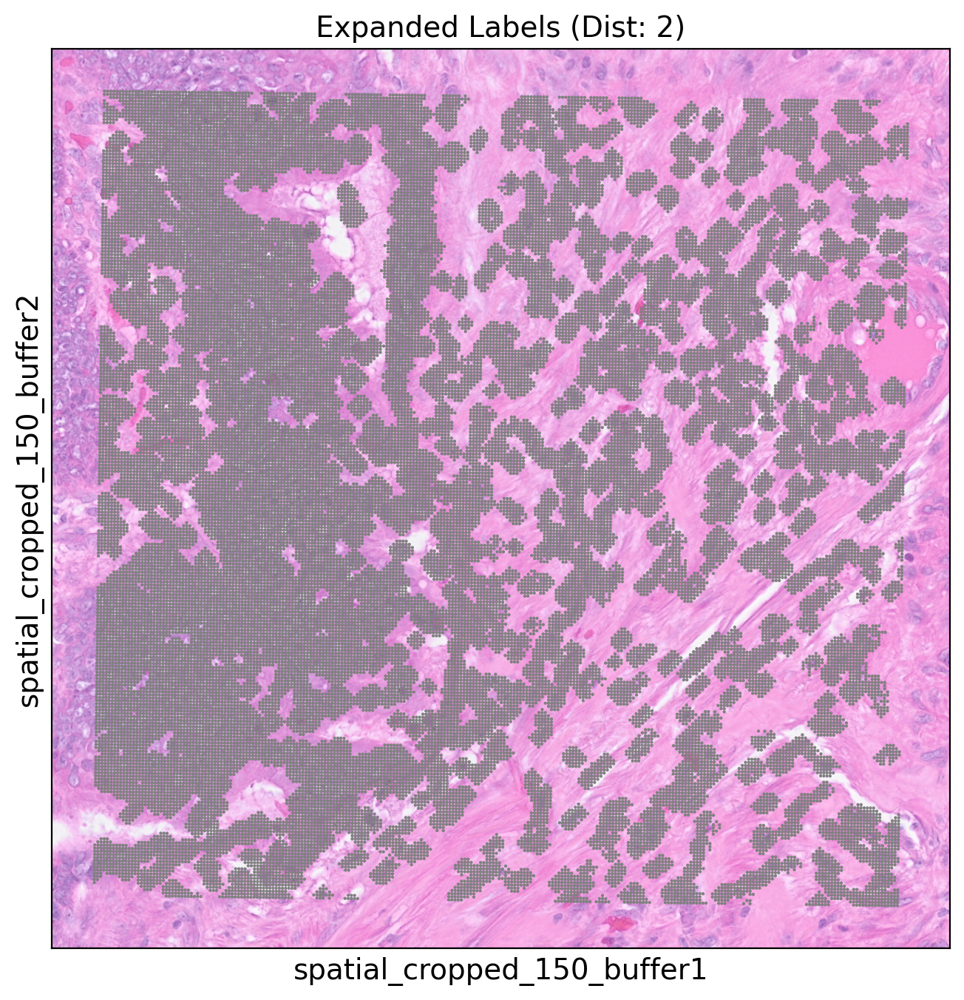

In [9]:
# --- 1. Dynamic Key Generation ---
# mpp変数の値に応じて、bin2cellが生成した画像キーを正しく指定します
img_key = f"{mpp}_mpp_150_buffer"
basis_key = "spatial_cropped_150_buffer"
labels_key = "labels_he"
expanded_labels_key = "labels_he_expanded"

print(f"🚀 Expanding labels...")
print(f"   Input Label Key: {labels_key}")
print(f"   Max Bin Distance: {max_bin_distance}")
print(f"   Using Image Key: {img_key}")

# --- 2. Run Label Expansion ---
if labels_key in sp_adata.obs:
    try:
        # 核のラベル(labels_he)を起点に、周囲のビンへ領域を拡張
        b2c.expand_labels(
            sp_adata,
            labels_key=labels_key,
            max_bin_distance=max_bin_distance,
            expanded_labels_key=expanded_labels_key,
        )
        print(f"✅ Labels expanded successfully. Key: {expanded_labels_key}")

        # --- 3. Visualization on ROI ---
        # ROIマスクの再定義 (変数が残っていることを前提)
        mask = (
            (sp_adata.obs["array_row"] >= mask_small_x1)
            & (sp_adata.obs["array_row"] <= mask_small_x2)
            & (sp_adata.obs["array_col"] >= mask_small_y1)
            & (sp_adata.obs["array_col"] <= mask_small_y2)
        )

        if np.sum(mask) > 0:
            bdata = sp_adata[mask].copy()

            # 0 (背景) を除外
            bdata = bdata[bdata.obs[expanded_labels_key] > 0]

            # プロット用にカテゴリカル(文字列)に変換
            bdata.obs[expanded_labels_key] = bdata.obs[expanded_labels_key].astype(str)

            print(f"   Plotting {len(bdata)} spots in ROI...")

            # プロット
            fig, ax = plt.subplots(figsize=(8, 8))
            sc.pl.spatial(
                bdata,
                color=[expanded_labels_key],  # 単一リストにして色分けのみ表示
                img_key=img_key,  # 動的キーを使用
                basis=basis_key,
                legend_loc=None,  # 細胞数が多いため凡例は非表示
                show=False,
                ax=ax,
                title=f"Expanded Labels (Dist: {max_bin_distance})",
                cmap="tab20",  # 色分けを見やすく
                alpha_img=0.7,
            )
            plt.show()

            # 保存が必要な場合
            # expanded_filename = "spatial_expanded_labels.pdf"
            # expanded_full_path = os.path.join(save_path_for_today, expanded_filename)
            # fig.savefig(expanded_full_path, bbox_inches="tight", dpi=300)

            del bdata
            print("Done! Go ahead.")
        else:
            print("⚠️ ROI Mask is empty.")

    except Exception as e:
        print(f"❌ Error during expansion: {e}")
else:
    print(
        f"❌ Error: Key '{labels_key}' not found in sp_adata.obs. Did you run StarDist?"
    )

🚀 Starting GEX-based Segmentation...
   MPP: 0.5
   Prob Thresh (GEX): 0.25
   Save Path: /tmp/gex_image.tif
✅ Grid image generated.
GEX shape: (13400, 13400) uint8 0 255
Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
effective: block_size=(4096, 4096), min_overlap=(128, 128), context=(128, 128)


100%|██████████| 16/16 [05:56<00:00, 22.30s/it]


Detected objects: 32663 max label: 32663
saved: /tmp/gex_labels.npz
spots with labels_gex > 0: 1450519
the obs value 'labels_gex' has more than 103 categories. Uniform 'grey' color will be used for all categories.


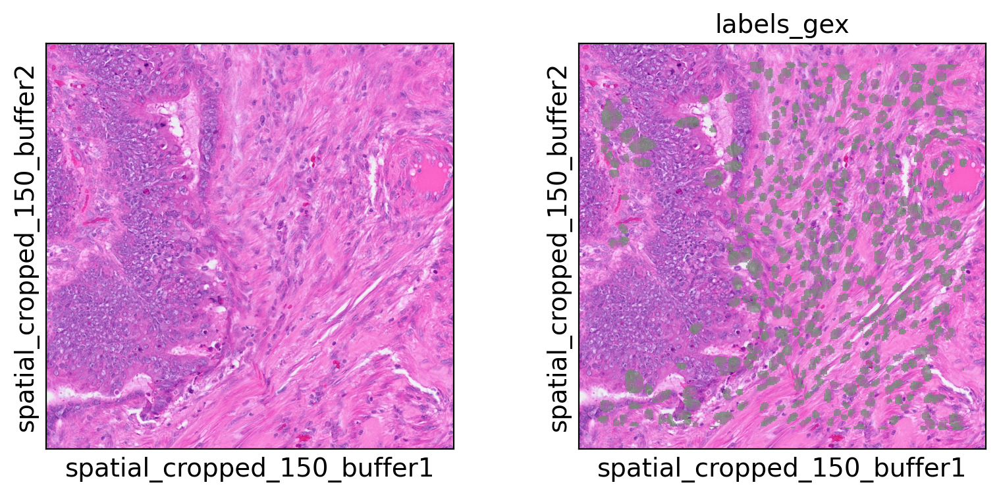

Salvaged 1909 secondary labels
the obs value 'labels_joint' has more than 103 categories. Uniform 'grey' color will be used for all categories.


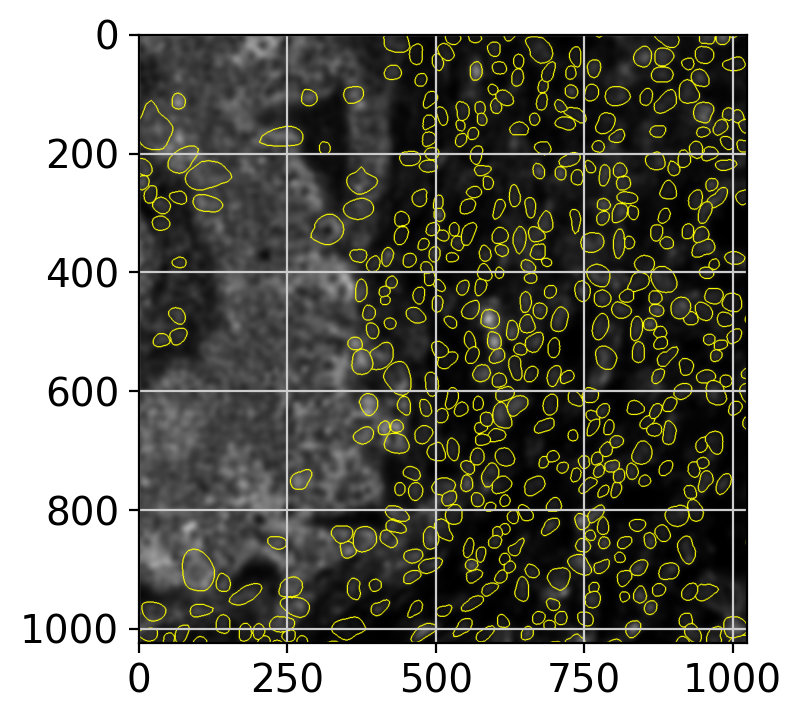

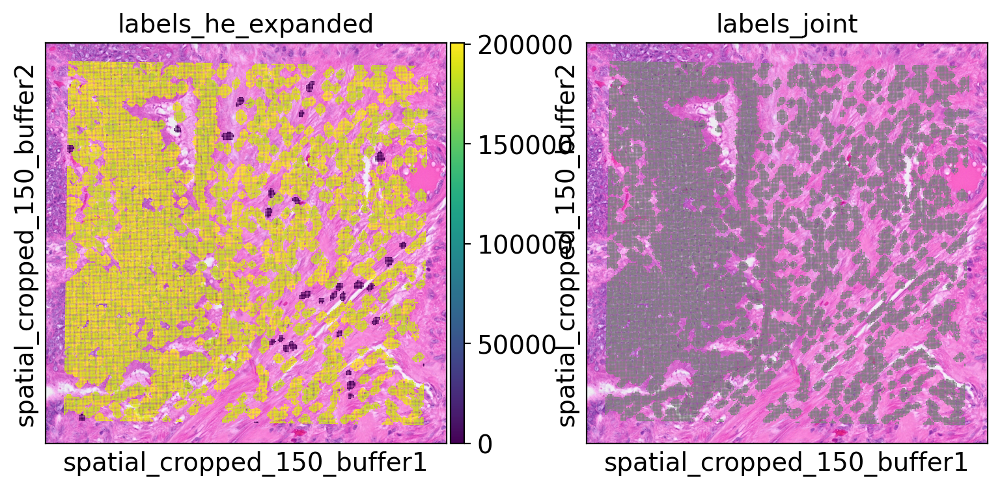

91611

In [15]:
# --- 1. Setup Paths & Variables ---
# Ensure paths are defined. Adjust filename if needed.
gex_full_path = os.path.join(TMP_PATH, "gex_image.tif")
gex_labels_path = os.path.join(TMP_PATH, "gex_labels.npz")
if os.path.exists(gex_full_path):
    os.remove(gex_full_path)
if os.path.exists(gex_labels_path):
    os.remove(gex_labels_path)

print(f"🚀 Starting GEX-based Segmentation...")
print(f"   MPP: {mpp}")
print(f"   Prob Thresh (GEX): {prob_thresh_GEX}")
print(f"   Save Path: {gex_full_path}")

# --- 2. Generate Grid Image from Expression ---
# Creates a synthetic image based on 'n_counts_adjusted'
# High expression areas become bright spots (like fluorescence)
b2c.grid_image(
    adata=sp_adata, val="n_counts_adjusted", mpp=mpp, sigma=5, save_path=gex_full_path
)
print("✅ Grid image generated.")
img = tifffile.imread(gex_full_path)
print("GEX shape:", img.shape, img.dtype, img.min(), img.max())
img_norm = normalize(img, 3, 99.8, axis=None)  # ←ここが肝

# plt.figure(figsize=(6,6))
# plt.imshow(img, cmap="gray")
# plt.title("Raw GEX grid image")
# plt.axis("off")
# plt.show()

model = StarDist2D.from_pretrained("2D_versatile_fluo")

labels, details = model.predict_instances_big(
    img_norm.astype("float32"),
    axes="YX",
    block_size=STEP,
    min_overlap=context,
    context=context,
    prob_thresh= prob_thresh_GEX,
    nms_thresh= nms_thresh/5,
    scale=1.0,
    nms_kwargs={"use_kdtree": True, "verbose": False},
)

n_detected = len(details.get("points", []))
print("Detected objects:", n_detected, "max label:", labels.max())

gex_labels_path = os.path.join(TMP_PATH, "gex_labels.npz")
if os.path.exists(gex_labels_path):
    os.remove(gex_labels_path)

labels_sparse = scipy.sparse.csr_matrix(labels.astype("int32"))
scipy.sparse.save_npz(gex_labels_path, labels_sparse)
print("saved:", gex_labels_path)

b2c.insert_labels(
    sp_adata,
    labels_npz_path=gex_labels_path,
    basis="array",
    spatial_key=None,      # arrayの場合は使わない
    mpp=mpp,
    labels_key="labels_gex",
)
print("spots with labels_gex > 0:", (sp_adata.obs["labels_gex"] > 0).sum())

bdata = sp_adata[mask]

# 0 means unassigned
bdata = bdata[bdata.obs["labels_gex"] > 0]
bdata.obs["labels_gex"] = bdata.obs["labels_gex"].astype(str)

sc.pl.spatial(
    bdata,
    color=[None, "labels_gex"],
    img_key="0.5_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
    legend_loc=None,
    show=True,
)
# plt.savefig(gex_label_image_full_path, bbox_inches="tight", dpi=300) # to save figure as pdf
# plt.close()

# the label viewer wants a crop of the processed image
# get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="array", mpp=mpp)
rendered = b2c.view_labels(
    image_path=gex_full_path,
    labels_npz_path=gex_labels_path,
    crop=crop,
)
plt.imshow(rendered)
# plt.savefig(gex_label_pdf_full_path_pdf, bbox_inches="tight", dpi=300) # to save figure as pdf
b2c.salvage_secondary_labels(
    sp_adata,
    primary_label="labels_he_expanded",
    secondary_label="labels_gex",
    labels_key="labels_joint",
)

bdata = sp_adata[mask]

# 0 means unassigned
bdata = bdata[bdata.obs["labels_joint"] > 0]
bdata.obs["labels_joint"] = bdata.obs["labels_joint"].astype(str)

sc.pl.spatial(
    bdata,
    color=["labels_he_expanded", "labels_joint"],
    img_key="0.5_mpp_150_buffer",
    basis="spatial_cropped_150_buffer",
    legend_loc=None,
    save=False,
)
# plt.savefig(save_svg_path, bbox_inches='tight', dpi=300)
# plt.close()
del bdata
gc.collect()

In [16]:
# =========================================================
# Simple Bin2Cell Widget (Auto labels_key switching)
# =========================================================

html_note = widgets.HTML("""
<b>Important selection:</b> nuclei segmentation with or without gene expression data.<br>
Noise is removed downstream (minimum 2um bin area).<br>
There are often no major problems with the use of gene expression data.
""")

mode_w = widgets.ToggleButtons(
    options=[
        ("With gene expression", "with_gex"),
        ("Without gene expression", "no_gex"),
    ],
    value="with_gex",
    description="Mode:",
)

btn_run = widgets.Button(
    description="Run bin_to_cell & Plot",
    button_style="success",
    icon="play"
)

out = widgets.Output()

# --- auto labels_key selection ---
def get_labels_key():
    if mode_w.value == "with_gex":
        key = "labels_joint"
    else:
        key = "labels_he_expanded"

    if key not in sp_adata.obs.columns:
        raise ValueError(f"'{key}' not found in sp_adata.obs")

    return key


def run_bin2cell(_):
    global cdata
    with out:
        clear_output(wait=True)

        try:
            labels_key = get_labels_key()

            print("🚀 Running bin_to_cell")
            print("   Mode:", mode_w.value)
            print("   labels_key:", labels_key)
            print("Running...")

            cdata = b2c.bin_to_cell(
                sp_adata,
                labels_key=labels_key,
                spatial_keys=["spatial", "spatial_cropped_150_buffer"],
            )

            print("Done!")
            print("✅ bin_to_cell complete")
            print("   Cells:", cdata.n_obs)

            cell_mask = (
                (cdata.obs["array_row"] >= mask_small_x1)
                & (cdata.obs["array_row"] <= mask_small_x2)
                & (cdata.obs["array_col"] >= mask_small_y1)
                & (cdata.obs["array_col"] <= mask_small_y2)
            )
            
            ddata = cdata[cell_mask]
            sc.set_figure_params(fontsize=20, figsize=[7, 7])
            sc.pl.spatial(
                ddata,
                color=["bin_count"],
                img_key="0.5_mpp_150_buffer",
                basis="spatial_cropped_150_buffer",
                s=4,
                save=False
            )
            print("Go ahead.")

            del ddata

        except Exception as e:
            print("❌ Error:", e)


btn_run.on_click(run_bin2cell)

display(widgets.VBox([
    widgets.HTML("<h3>🧬 Bin2Cell (Simple Mode)</h3>"),
    html_note,
    mode_w,
    btn_run,
    out
]))

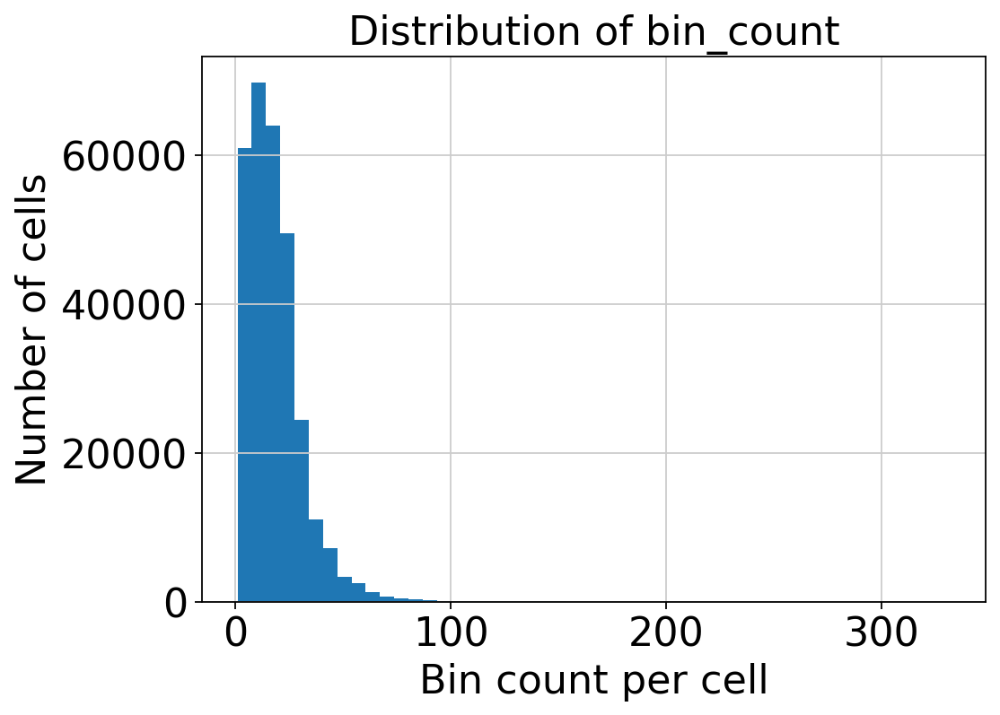

Median bin_count: 16.0
Mean bin_count: 17.938862355800268


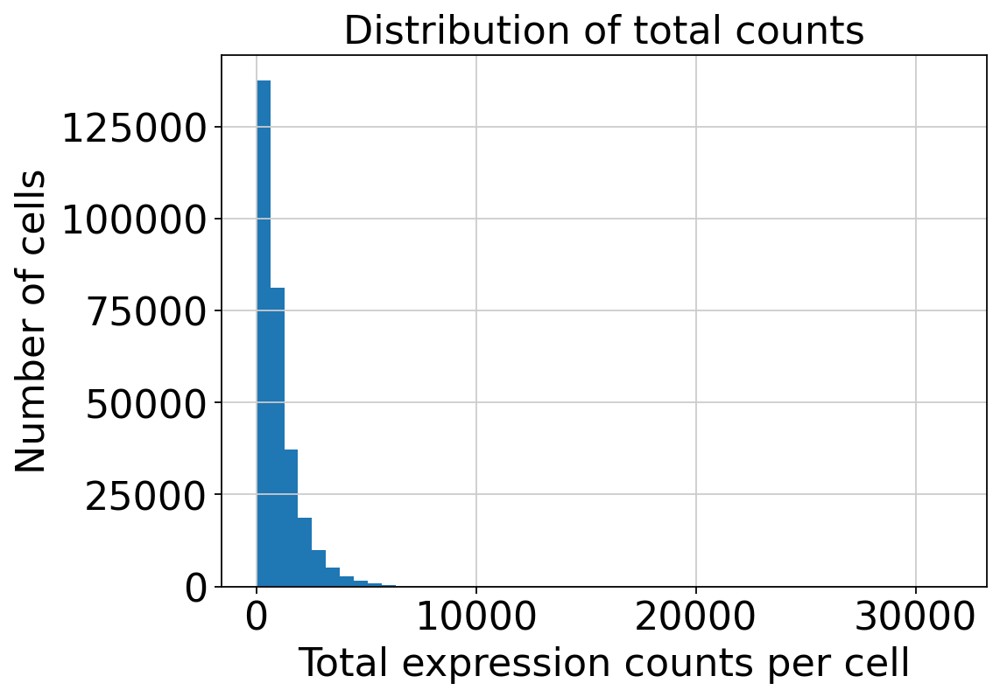

Median total counts: 692.0417107830166
Mean total counts: 983.1452055032239


In [17]:
plt.figure(figsize=(7,5))
plt.hist(cdata.obs["bin_count"], bins=50)
plt.xlabel("Bin count per cell")
plt.ylabel("Number of cells")
plt.title("Distribution of bin_count")
plt.show()

print("Median bin_count:", np.median(cdata.obs["bin_count"]))
print("Mean bin_count:", np.mean(cdata.obs["bin_count"]))

if hasattr(cdata.X, "sum"):
    total_counts = np.array(cdata.X.sum(axis=1)).flatten()
else:
    total_counts = cdata.obs["total_counts"]

plt.figure(figsize=(7,5))
plt.hist(total_counts, bins=50)
plt.xlabel("Total expression counts per cell")
plt.ylabel("Number of cells")
plt.title("Distribution of total counts")
plt.show()

print("Median total counts:", np.median(total_counts))
print("Mean total counts:", np.mean(total_counts))

In [19]:
# Save anndata
c_path = os.path.join(RESULTS_PATH, SAMPLE_NAME + "_b2c.h5ad")
s_path = os.path.join(RESULTS_PATH, SAMPLE_NAME + "_2um.h5ad")

save_sp_w = widgets.Checkbox(value=False, description="Also save 2um sp_adata")
rm_exist_w = widgets.Checkbox(value=True, description="Remove existing files")
del_after_w = widgets.Checkbox(value=True, description="Delete objects after save")

btn_save = widgets.Button(description="💾 Save h5ad", button_style="success")
out = widgets.Output()

def _fmt_bytes(n):
    for unit in ["B","KB","MB","GB","TB"]:
        if n < 1024:
            return f"{n:.2f} {unit}"
        n /= 1024
    return f"{n:.2f} PB"

def do_save(_):
    with out:
        clear_output(wait=True)

        print("=== Saving AnnData ===")
        print("cdata ->", c_path)
        print("sp_adata ->", s_path)
        print()

        if "cdata" not in globals():
            print("❌ cdata not found.")
            return

        os.makedirs(RESULTS_PATH, exist_ok=True)

        if rm_exist_w.value:
            for p in [c_path, s_path]:
                if os.path.exists(p):
                    os.remove(p)
                    print("🧹 removed:", p)

        t0 = time.time()

        # --- cdata ---
        print("💾 Saving cdata ...")
        cdata.write_h5ad(c_path)
        size = os.path.getsize(c_path)
        print(f"✅ cdata saved ({_fmt_bytes(size)})")

        # --- sp_adata (optional) ---
        if save_sp_w.value:
            if "sp_adata" in globals():
                print("💾 Saving sp_adata ...")
                sp_adata.write_h5ad(s_path)
                size = os.path.getsize(s_path)
                print(f"✅ sp_adata saved ({_fmt_bytes(size)})")
            else:
                print("⚠️ sp_adata not found, skipped.")

        # --- memory cleanup ---
        if del_after_w.value:
            del globals()["cdata"]
            if save_sp_w.value and "sp_adata" in globals():
                del globals()["sp_adata"]
            gc.collect()
            print("🧠 Memory freed.")

        print(f"\nDone. Total time: {time.time()-t0:.2f} sec")

btn_save.on_click(do_save)

display(
    widgets.VBox([
        widgets.HTML("<h3>💾 Save AnnData</h3>"),
        widgets.HBox([save_sp_w, rm_exist_w, del_after_w]),
        btn_save,
        out
    ])
)

### Go to next notebook.
#### With single cell data -> single_cell_annotation_tutorial
#### Without single cell data -> label_transfer_tutorial_without_single_cell_data